# Multi-class embedding comparison — p80 / p90 / p95 SPI subsets (2026-06-04)

Source configs: `configs/generate/embeddings/proof-benchmarked-p{80,90,95}.yaml`.
Compares 2D/3D PCA and UMAP across the three benchmark-curated SPI subsets, to assess how each subset preserves between-MTS information.

**Design notes (intentionally excluded):**
- *Top-k after PCA* — for 2D/3D PCA visualisation this is identity (PCA composes), so there is no experiment. For UMAP a PCA-preprocessing pass would denoise but it would also confound the p80/p90/p95 comparison (two variables at once). A scree / cumulative-variance panel below answers the same question more cleanly.
- *Greedy FS* — supervised on `mts_class`, so it leaks class structure into an embedding-quality comparison and double-curates an already-curated subset. Belongs in a downstream classification analysis.

### Compute features (run once per subset, from project root)

```bash
python -m src.process_features --data-path data/embeddings/proof_benchmarked80_260603 --metric pearson
python -m src.process_features --data-path data/embeddings/proof_benchmarked90_260603 --metric pearson
python -m src.process_features --data-path data/embeddings/proof_benchmarked95_260603 --metric pearson
```

Outputs land at `features/data-embeddings-proof_benchmarked{80,90,95}_260603_pearson.npz`.

In [27]:
import importlib
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from umap import UMAP

import src.visualization
importlib.reload(src.visualization)
from src.visualization import plot_pca, plot_umap

In [28]:
# --- feature files per subset ---
FEATURES_DIR = Path("../../features")
SUBSETS = {
    "p80": FEATURES_DIR / "data-embeddings-proof_benchmarked80_260603_pearson.npz",
    "p90": FEATURES_DIR / "data-embeddings-proof_benchmarked90_260603_pearson.npz",
    "p95": FEATURES_DIR / "data-embeddings-proof_benchmarked95_260603_pearson.npz",
}

# --- class filter (comment a line to drop that class) ---
CLASSES = [
    "cauchy-noise", "gaussian-noise",
    "kuramoto_omega-fast", "kuramoto_omega-slow",
    "defect-turbulence", "sti-i",
    "var-phi-0.2_cpl-0.4",
    "var-phi-0.2_cpl-0.8",   # comment out to drop
    "var-phi-0.95_cpl-0.4",
    "wave-1d",
]
M_FILTER = None  # int to filter by M, or None

In [29]:
def load_subset(path: Path):
    if not path.exists():
        raise FileNotFoundError(
            f"Missing features file: {path}. Run process_features.py (see header)."
        )
    d = np.load(path, allow_pickle=True)
    y = d["y"]
    M = d["M"].astype(int)
    T = d["T"].astype(int)
    mask = np.isin(y, CLASSES)
    if M_FILTER is not None:
        mask &= (M == M_FILTER)
    meta_df = pd.DataFrame({
        "mts_class": y[mask],
        "M": M[mask],
        "T": T[mask],
        "instance": d["instance"][mask],
        "dataset_paths": d["dataset_paths"][mask],
    })
    return d["X"][mask], meta_df


data = {label: load_subset(path) for label, path in SUBSETS.items()}
for label, (X, meta_df) in data.items():
    print(f"{label}: X={X.shape}, classes={sorted(meta_df['mts_class'].unique())}")

p80: X=(900, 32128), classes=['cauchy-noise', 'defect-turbulence', 'gaussian-noise', 'kuramoto_omega-fast', 'kuramoto_omega-slow', 'sti-i', 'var-phi-0.2_cpl-0.4', 'var-phi-0.2_cpl-0.8', 'var-phi-0.95_cpl-0.4', 'wave-1d']
p90: X=(900, 40184), classes=['cauchy-noise', 'defect-turbulence', 'gaussian-noise', 'kuramoto_omega-fast', 'kuramoto_omega-slow', 'sti-i', 'var-phi-0.2_cpl-0.4', 'var-phi-0.2_cpl-0.8', 'var-phi-0.95_cpl-0.4', 'wave-1d']
p95: X=(900, 44544), classes=['cauchy-noise', 'defect-turbulence', 'gaussian-noise', 'kuramoto_omega-fast', 'kuramoto_omega-slow', 'sti-i', 'var-phi-0.2_cpl-0.4', 'var-phi-0.2_cpl-0.8', 'var-phi-0.95_cpl-0.4', 'wave-1d']


##### Feature-matrix heatmaps

RuntimeError: latex was not able to process the following string:
b'# PCs (log)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error file.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.27 (TeX Live 2025) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./file.tex
LaTeX2e <2024-11-01> patch level 2
L3 programming layer <2025-01-18>
(/usr/local/texlive/2025/texmf-dist/tex/latex/base/article.cls
Document Class: article 2024/06/29 v1.4n Standard LaTeX document class
(/usr/local/texlive/2025/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2025/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2025/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2025/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2025/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2025/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2025/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2025/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2025/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2025/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2025/texmf-dist/tex/latex/firstaid/underscore-ltx.sty)
(/usr/local/texlive/2025/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2025/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file file.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! You can't use `macro parameter character #' in vertical mode.
l.30 {\rmfamily #
                  PCs (log)}%
No pages of output.
Transcript written on file.log.




<Figure size 1600x1000 with 1 Axes>

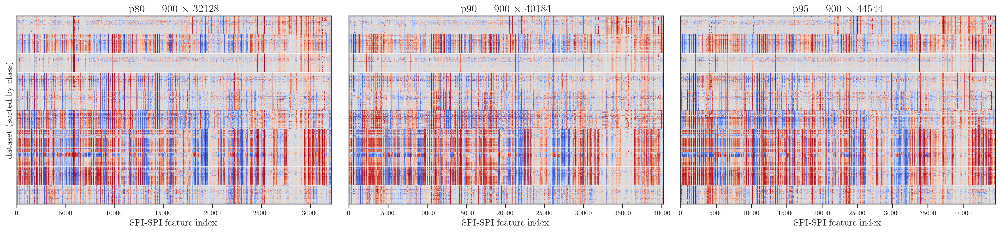

In [32]:
fig, axes = plt.subplots(1, 3, figsize=(21, 5), dpi=200)
for ax, (label, (X, meta_df)) in zip(axes, data.items()):
    y = meta_df["mts_class"].to_numpy()
    order = np.argsort(y)
    X_sorted = X[order]
    y_sorted = y[order]
    ax.imshow(X_sorted, aspect="auto", cmap="coolwarm", vmin=-1, vmax=1, interpolation="none")
    boundaries = np.where(np.diff(np.searchsorted(np.unique(y_sorted), y_sorted)))[0] + 0.5
    for b in boundaries:
        ax.axhline(b, color="white", linewidth=0.5)
    ax.set_title(fr"{label} | {X_sorted.shape[0]} $\times$ {X_sorted.shape[1]}")
    ax.set_xlabel("SPI-SPI feature index")
    ax.set_yticks([])
axes[0].set_ylabel("dataset (sorted by class)")
plt.tight_layout()
plt.show()

##### Scree / cumulative variance

Direct read-out of how much linear information each subset retains. Knees at 90 / 95 / 99 % are marked.

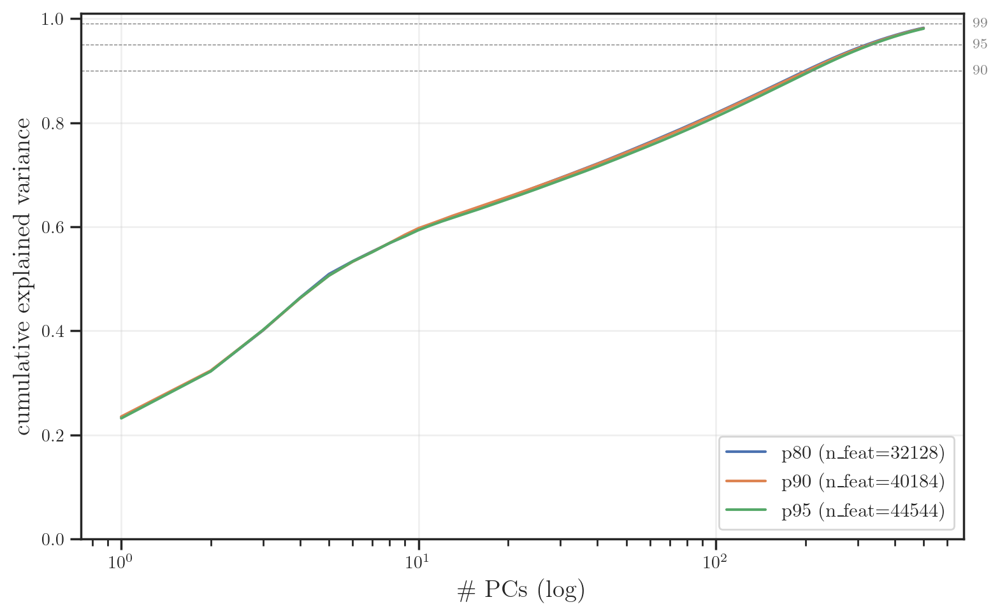

subset   n_feat    k@90%    k@95%    k@99%
p80       32128      201      322     None
p90       40184      204      327     None
p95       44544      211      334     None


In [39]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=200)
colors = {"p80": "C0", "p90": "C1", "p95": "C2"}
k_table = []
for label, (X, _) in data.items():
    Xs = StandardScaler().fit_transform(X)
    n_pc = min(Xs.shape[0] - 1, Xs.shape[1], 500)
    cum = np.cumsum(PCA(n_components=n_pc, random_state=0).fit(Xs).explained_variance_ratio_)
    ks = {thr: (int(np.searchsorted(cum, thr)) + 1 if np.searchsorted(cum, thr) < n_pc else None)
          for thr in (0.9, 0.95, 0.99)}
    k_table.append((label, X.shape[1], ks))
    ax.plot(np.arange(1, n_pc + 1), cum, color=colors[label],
            label=f"{label} (n_feat={X.shape[1]})")
for thr in (0.9, 0.95, 0.99):
    ax.axhline(thr, color="gray", lw=0.5, ls="--")
    ax.text(1.01, thr, f"{int(thr*100)}%", color="gray", fontsize=8,
            va="center", transform=ax.get_yaxis_transform())
ax.set_xscale("log")
ax.set_xlabel(r"\# PCs (log)")
ax.set_ylabel(r"cumulative explained variance")
ax.set_ylim(0, 1.01)
ax.grid(alpha=0.3)
ax.legend(loc="lower right")
plt.tight_layout(); plt.show()

print(f"{'subset':<6} {'n_feat':>8} {'k@90%':>8} {'k@95%':>8} {'k@99%':>8}")
for label, n_feat, ks in k_table:
    print(f"{label:<6} {n_feat:>8} {str(ks[0.9]):>8} {str(ks[0.95]):>8} {str(ks[0.99]):>8}")

##### 2D PCA

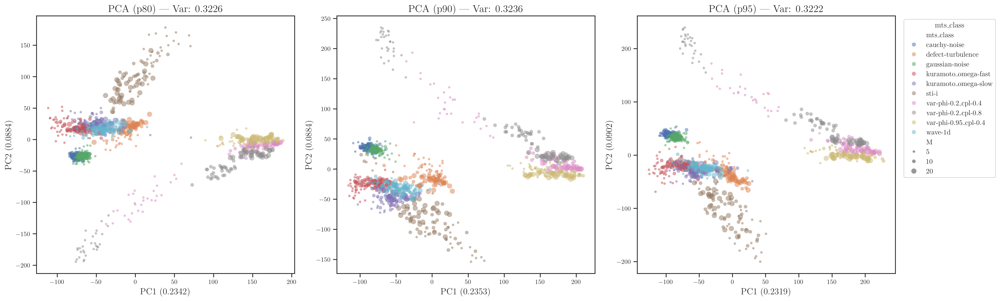

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(22, 7), dpi=300)
for ax, (label, (X, meta_df)) in zip(axes, data.items()):
    plot_pca(X, meta_df, ax=ax, alpha=0.5, s=30, kde=False, feature_space=label)
for ax in axes[:-1]:
    if ax.get_legend() is not None:
        ax.get_legend().remove()
plt.tight_layout()
plt.show()

##### 2D UMAP

/Users/wedi0306/Code/mts-spi-study-cluster/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/wedi0306/Code/mts-spi-study-cluster/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/wedi0306/Code/mts-spi-study-cluster/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


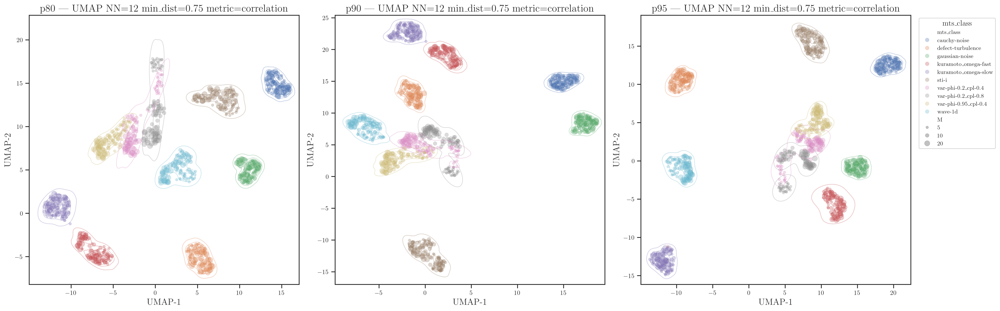

In [34]:
# Shared UMAP hyperparameters for fair across-subset comparison.
N_NEIGHBORS = 12
MIN_DIST = 0.75
METRIC = "correlation"
SCALED = False

umap_embeddings = {}
fig, axes = plt.subplots(1, 3, figsize=(22, 7), dpi=300)
for ax, (label, (X, meta_df)) in zip(axes, data.items()):
    X_in = StandardScaler().fit_transform(X) if SCALED else X
    emb = UMAP(n_neighbors=N_NEIGHBORS, min_dist=MIN_DIST, metric=METRIC,
               random_state=0, verbose=False).fit_transform(X_in)
    umap_embeddings[label] = emb
    df_emb = meta_df.assign(umap_x=emb[:, 0], umap_y=emb[:, 1])
    sns.kdeplot(data=df_emb, x="umap_x", y="umap_y", hue="mts_class",
                levels=5, alpha=0.3, linewidths=1, ax=ax, legend=False)
    show_legend = "full" if ax is axes[-1] else False
    sns.scatterplot(data=df_emb, x="umap_x", y="umap_y", hue="mts_class",
                    size="M", alpha=0.3, edgecolor="face", ax=ax, legend=show_legend)
    ax.set_title(f"{label} | UMAP NN={N_NEIGHBORS} min_dist={MIN_DIST} metric={METRIC}")
    ax.set_xlabel("UMAP-1"); ax.set_ylabel("UMAP-2")
    ax.set_box_aspect(1)
if axes[-1].get_legend() is not None:
    axes[-1].legend(title="mts_class", loc="upper left",
                    bbox_to_anchor=(1.02, 1), fontsize=9, frameon=True)
plt.tight_layout()
plt.show()

##### 3D PCA (Plotly)

In [35]:
for label, (X, meta_df) in data.items():
    Xs = StandardScaler().fit_transform(X)
    pca = PCA(n_components=3, random_state=0)
    emb3 = pca.fit_transform(Xs)
    var3 = pca.explained_variance_ratio_
    df3 = meta_df.assign(
        pc1=emb3[:, 0], pc2=emb3[:, 1], pc3=emb3[:, 2],
        instance_str=meta_df["instance"].astype(str),
        dataset_paths_str=meta_df["dataset_paths"].astype(str),
    )
    fig = px.scatter_3d(
        df3, x="pc1", y="pc2", z="pc3",
        color="mts_class", size="M", size_max=16,
        hover_data={
            "mts_class": True, "M": True, "T": True,
            "instance_str": True, "dataset_paths_str": False,
            "pc1": ":.2f", "pc2": ":.2f", "pc3": ":.2f",
        },
        title=(f"{label} | PCA 3D | Var: {var3.sum():.3f} "
               f"(PC1 {var3[0]:.3f}, PC2 {var3[1]:.3f}, PC3 {var3[2]:.3f})"),
        width=1100, height=800,
    )
    fig.update_traces(marker=dict(opacity=0.6))
    fig.update_layout(
        legend=dict(title="mts_class"),
        scene=dict(
            xaxis_title=f"PC1 ({var3[0]:.3f})",
            yaxis_title=f"PC2 ({var3[1]:.3f})",
            zaxis_title=f"PC3 ({var3[2]:.3f})",
            aspectmode="cube",
        ),
    )
    fig.show()

##### 3D UMAP (Plotly)

In [36]:
for label, (X, meta_df) in data.items():
    X_in = StandardScaler().fit_transform(X) if SCALED else X
    emb3 = UMAP(
        n_components=3, n_neighbors=N_NEIGHBORS, min_dist=MIN_DIST, metric=METRIC,
        random_state=0, verbose=False,
    ).fit_transform(X_in)
    df3 = meta_df.assign(
        u1=emb3[:, 0], u2=emb3[:, 1], u3=emb3[:, 2],
        instance_str=meta_df["instance"].astype(str),
        dataset_paths_str=meta_df["dataset_paths"].astype(str),
    )
    fig = px.scatter_3d(
        df3, x="u1", y="u2", z="u3",
        color="mts_class", size="M", size_max=16,
        hover_data={
            "mts_class": True, "M": True, "T": True,
            "instance_str": True, "dataset_paths_str": False,
            "u1": ":.2f", "u2": ":.2f", "u3": ":.2f",
        },
        title=(f"{label} | UMAP 3D "
               f"(NN={N_NEIGHBORS}, min_dist={MIN_DIST}, metric={METRIC}, scaled={SCALED})"),
        width=1100, height=800,
    )
    fig.update_traces(marker=dict(opacity=0.6))
    fig.update_layout(legend=dict(title="mts_class"), scene=dict(aspectmode="cube"))
    fig.show()

/Users/wedi0306/Code/mts-spi-study-cluster/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


/Users/wedi0306/Code/mts-spi-study-cluster/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


/Users/wedi0306/Code/mts-spi-study-cluster/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
